#GANs on Monet Painting Dataset

## Purpose
The goal of this notebook is to train a Generative Adversarial Network (GAN) to learn Monet's styles from it's paintings, apply it to pictures to generate new "Monet-like" images.

A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images while the discriminator is trying to accurately classify the real vs. generated images.

The two models will work against each other, resulting in better outputs.

The dataset and the problem statement are part of a Kaggle Competition, called [I’m Something of a Painter Myself ](https://www.kaggle.com/competitions/gan-getting-started/overview).

Author: [Bruno Velleca](https://github.com/brucamail)

In [ ]:
# importing the data from Kaggle competion
from google.colab import userdata
import os

os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

!kaggle competitions download -c gan-getting-started
!unzip gan-getting-started.zip

#Exploratory Data Analysis

## Data Loading and Overview

**2 sets of images are provided in 2 folders**

1. `monet_jpg`: 300 paintings, 4.7MB - To be used to train the model on Monet's style.
2. `photo_jpg`: 7038 landscape photos, 93.6MB To be transformed into Monet style's pictures.

Every picture is 256 x 256 pixels and RBG (256, 256, 3).


In [ ]:
#importing rlevant libraries
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras


In [ ]:
def count_items_in_folder(folder_path):
    items_in_folder = os.listdir(folder_path)
    num_items = len(items_in_folder)
    return num_items

def get_size_of_folder(folder_path):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(folder_path):
        for f in filenames:
            fp = os.path.join(dirpath, f)
            total_size += os.path.getsize(fp)
    return total_size

#counting the size of a monet_jpg folder
monet_jpg_path = '/content/monet_jpg'
photo_jpg_path = '/content/photo_jpg'

monet_jpg_size = get_size_of_folder(monet_jpg_path)
photo_jpg_size = get_size_of_folder(photo_jpg_path)

monet_jpg_count = count_items_in_folder(monet_jpg_path)
photo_jpg_count = count_items_in_folder(photo_jpg_path)

print(f'Number of items in the {monet_jpg_path} folder: {monet_jpg_count}')
print(f'Size of the monet_jpg folder: {monet_jpg_size / (1024 * 1024):.2f} MB')
print('\n')
print(f'Number of items in the {photo_jpg_path} folder: {photo_jpg_count}')
print(f'Size of the photo_jpg folder: {photo_jpg_size / (1024 * 1024):.2f} MB')


Number of items in the /content/monet_jpg folder: 300
Size of the monet_jpg folder: 4.71 MB


Number of items in the /content/photo_jpg folder: 7038
Size of the photo_jpg folder: 93.60 MB


In [ ]:
#randomly loading 5 pictures from a folder using the path
# import random
base_monet_jpg_path = '/content/monet_jpg'
base_photo_jpg_path = '/content/photo_jpg'

monet_pics = []
photo_pics = []

for i in range(5):
    # Get a random file from the base directory
    monet_jpg_file = random.choice(os.listdir(base_monet_jpg_path))
    photo_jpg_file = random.choice(os.listdir(base_photo_jpg_path))

    # Construct the full file path for printing or other operations
    current_monet_path = os.path.join(base_monet_jpg_path, monet_jpg_file)
    current_photo_path = os.path.join(base_photo_jpg_path, photo_jpg_file)
    monet_pics.append(current_monet_path)
    photo_pics.append(current_photo_path)

# checking how many pixels each image has
for monet_pic, photo_pic in zip(monet_pics, photo_pics):
    monet_img = mpimg.imread(monet_pic)
    photo_img = mpimg.imread(photo_pic)
    print(f'Monet image shape: {monet_img.shape}')
    print(f'Photo image shape: {photo_img.shape}')
    print('\n')

Monet image shape: (256, 256, 3)
Photo image shape: (256, 256, 3)


Monet image shape: (256, 256, 3)
Photo image shape: (256, 256, 3)


Monet image shape: (256, 256, 3)
Photo image shape: (256, 256, 3)


Monet image shape: (256, 256, 3)
Photo image shape: (256, 256, 3)


Monet image shape: (256, 256, 3)
Photo image shape: (256, 256, 3)




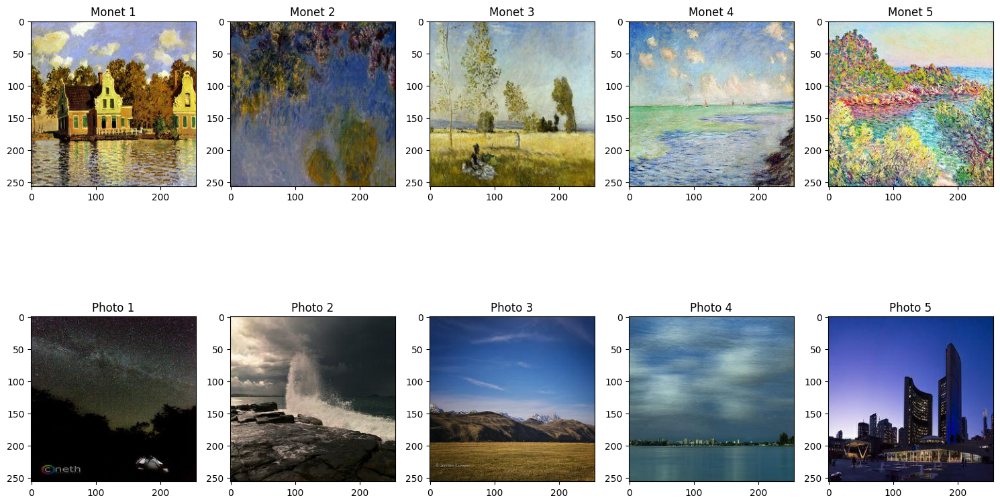

In [ ]:
#plotting the pictures
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

fig, axs = plt.subplots(2, 5, figsize=(15, 10))

for i, (monet_pic, photo_pic) in enumerate(zip(monet_pics, photo_pics)):
    col = i % 5
    ax = axs[0, col]
    ax.imshow(mpimg.imread(monet_pic))
    ax.set_title(f'Monet {i+1}')
    ax = axs[1, col]
    ax.imshow(mpimg.imread(photo_pic))
    ax.set_title(f'Photo {i+1}')

plt.tight_layout()
plt.show()

In [ ]:
#loading both datasets using keras
# import tensorflow as tf
# from tensorflow import keras
monet_dataset = tf.keras.utils.image_dataset_from_directory(
    base_monet_jpg_path,
    labels=None,
    image_size=(256, 256),
    shuffle=True,
)
print(f"Loaded dataset from: {base_monet_jpg_path}")

photo_dataset = tf.keras.utils.image_dataset_from_directory(
    base_photo_jpg_path,
    labels=None,
    image_size=(256, 256),
    shuffle=True
)

print(f"Loaded dataset from: {base_photo_jpg_path}")


#splitting the monet dataset in training and test
monet_train = monet_dataset.take(int(len(monet_dataset) * 0.8))
monet_test = monet_dataset.skip(int(len(monet_dataset) * 0.8))

photo_train = photo_dataset.take(int(len(photo_dataset) * 0.8))
photo_test = photo_dataset.skip(int(len(photo_dataset) * 0.8))

#commenting for now - no vlaue added to the final delivery
#Iterate through the dataset to check if the images loaded properly
# for images in monet_dataset.take(1):
# for images in photo_dataset.take(1):
#     print(f"Shape of a batch of images: {images.shape}")
#     plt.imshow(images[0].numpy().astype("uint8"))
#     plt.title("Example image from the dataset")
#     plt.axis("off")
#     plt.show()

Found 300 files.
Loaded dataset from: /content/monet_jpg
Found 7038 files.
Loaded dataset from: /content/photo_jpg


### Image Preprocessing
To avoid overfitting and get ready for training the model, it is recommended to apply the following image augmentation techniques to the training dataset:
1. Random jittering: *In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.*
2. Mirroring: *In random mirroring, the image is randomly flipped horizontally i.e., left to right.*

Adittionally, all images need to be normalized.

We'll be using [Tensorflow](https://www.tensorflow.org/tutorials/generative/cyclegan) once again to help us achieve it:



In [ ]:
#using Tensorflow's tutorial to build all the functions
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

def preprocess_image_train(image):
  image = random_jitter(image)
  image = normalize(image)
  return image

def preprocess_image_test(image):
  image = normalize(image)
  return image

In [ ]:
#because I used Keras to load the data, I need to unbatch() it before preprocessing it
monet_train = monet_train.cache().unbatch().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

photo_train = photo_train.cache().unbatch().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

monet_test = monet_test.cache().unbatch().map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

photo_test = photo_test.cache().unbatch().map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

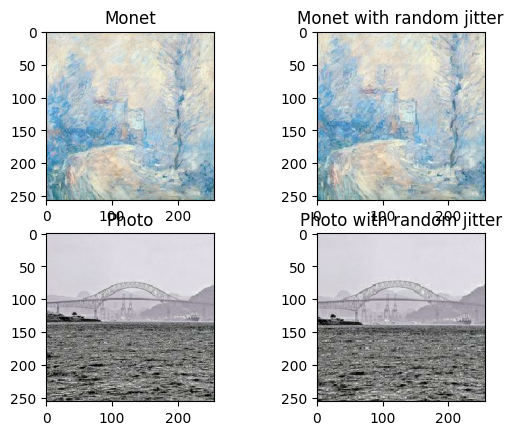

In [ ]:
#checking the images
sample_monet = next(iter(monet_train))
sample_photo = next(iter(photo_train))

plt.subplot(221)
plt.title('Monet')
plt.imshow(sample_monet[0] * 0.5 + 0.5)

plt.subplot(222)
plt.title('Monet with random jitter')
plt.imshow(random_jitter(sample_monet[0]) * 0.5 + 0.5)

plt.subplot(223)
plt.title('Photo')
plt.imshow(sample_photo[0] * 0.5 + 0.5)

plt.subplot(224)
plt.title('Photo with random jitter')
plt.imshow(random_jitter(sample_photo[0]) * 0.5 + 0.5)

It is possible to see that images have been mirrored randomly and some jitter was added to the pictures. Now it is time to build the model.

## Building the Model (CycleGAN)
The model architecture for the generator and the discriminator comes from the [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) example from tensorflow.

For the CycleGAN we'll levergae 2 generators (G and F) and 2 discriminators (X and Y).

* Generator G learns to transform image X to image Y.
* Generator F learns to transform image Y to image X.
* Discriminator D_X learns to differentiate between image X and generated image X (F(Y)).
* Discriminator D_Y learns to differentiate between image Y and generated image Y (G(X)).

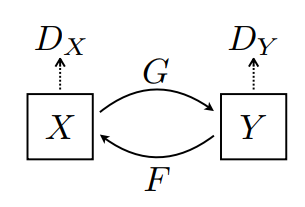

source: [TensorFlow CycleGAN](https://colab.research.google.com/drive/1wzMAXjUX7QqflnXSDJUVIFzTDHIha7qf#scrollTo=eN10wh9q0r-2&line=13&uniqifier=1)

### Building the Generator
source: https://www.tensorflow.org/tutorials/generative/pix2pix#build_an_input_pipeline_with_tfdata

The generator of is a modified U-Net. A U-Net consists of an encoder (downsampler) and decoder (upsampler).

**For this example, I had to change the normalization to InstanceNormalization instead of the original BatchNormalization used in the pix2pix tutorial.** I kept the original code commented.

* Each block in the encoder is: Convolution -> Instance normalization -> Leaky ReLU
* Each block in the decoder is: Transposed convolution -> Instance normalization -> Dropout (applied to the first 3 blocks) -> ReLU

There are skip connections between the encoder and decoder (as in the U-Net).

In [ ]:
OUTPUT_CHANNELS = 3

class InstanceNormalization(tf.keras.layers.Layer):
  """Instance Normalization Layer (https://arxiv.org/abs/1607.08022)."""

  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

  def build(self, input_shape):
    self.scale = self.add_weight(
        name='scale',
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02),
        trainable=True)

    self.offset = self.add_weight(
        name='offset',
        shape=input_shape[-1:],
        initializer='zeros',
        trainable=True)

  def call(self, x):
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + self.epsilon)
    normalized = (x - mean) * inv
    return self.scale * normalized + self.offset

#downsampler
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    # result.add(tf.keras.layers.BatchNormalization())
    result.add(InstanceNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

#upsampler
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  # result.add(tf.keras.layers.BatchNormalization())
  # result.add(tf.keras.layers.GroupNormalization())
  result.add(InstanceNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

Defining the Generator using downsampling & upsampling:

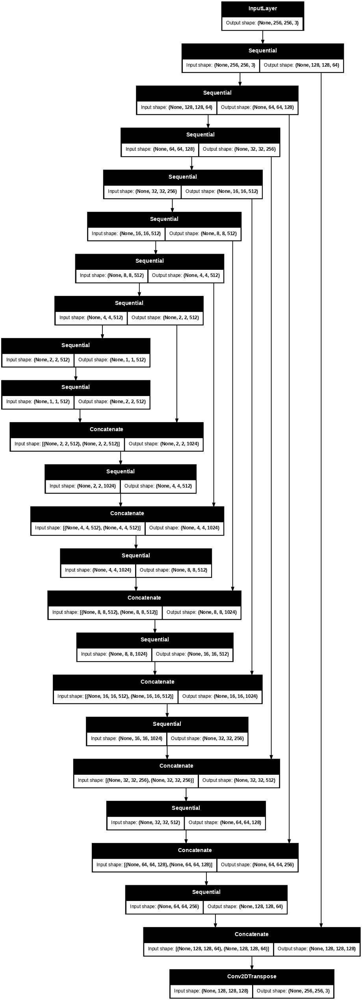

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

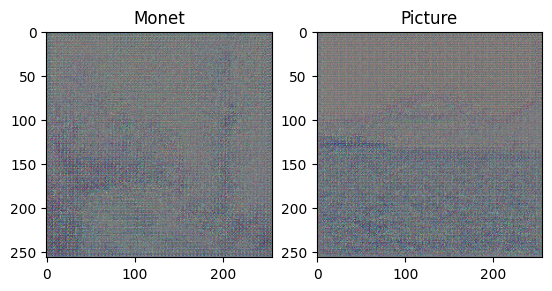

In [ ]:
#testing the generator
monet_sample_output = generator(sample_monet, training=False)
photo_sample_output = generator(sample_photo, training=False)

plt.subplot(121)
plt.title('Monet')
plt.imshow(monet_sample_output[0] * 0.5 + 0.5)
plt.subplot(122)
plt.title('Picture')
plt.imshow(photo_sample_output[0] * 0.5 + 0.5)

### Buidling the Discriminator
source: https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_discriminator

The discriminator is a convolutional PatchGAN classifier. It tries to classify if each image patch is real or not real, as described in the pix2pix paper.

**Similar change on the normalization was made when building the discriminator. I updated the code to use Instance Normalization instead of BatchNormalization.** Original code was kept as comment.

* Each block in the discriminator is: Convolution -> Instance normalization -> Leaky ReLU.
* The shape of the output after the last layer is (batch_size, 30, 30, 1).
Each 30 x 30 image patch of the output classifies a 70 x 70 portion of the input image.

The discriminator receives 2 inputs:
* The input image and the target image, which it should classify as real.
* The input image and the generated image (the output of the generator), which it should classify as fake.
* Use tf.concat([inp, tar], axis=-1) to concatenate these 2 inputs together.

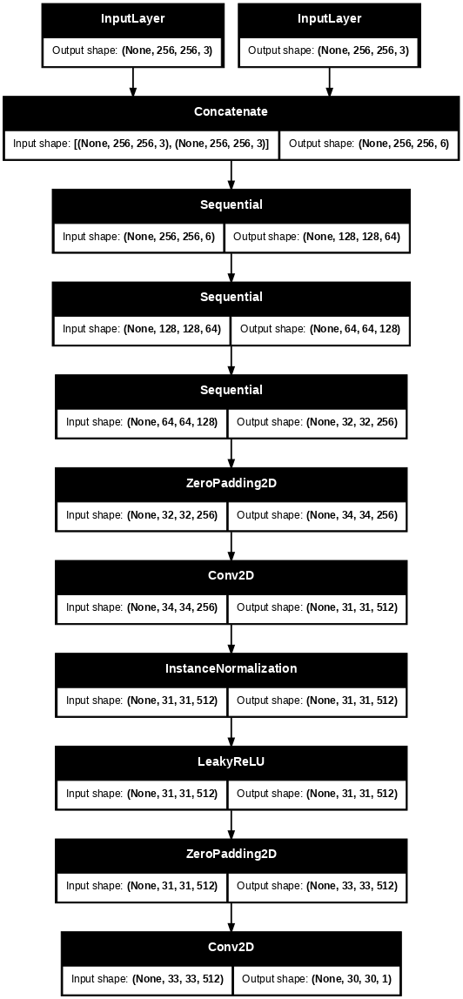

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  # batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  # batchnorm1 = result.add(InstanceNormalization())
  norm1 = InstanceNormalization()(conv)


  leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

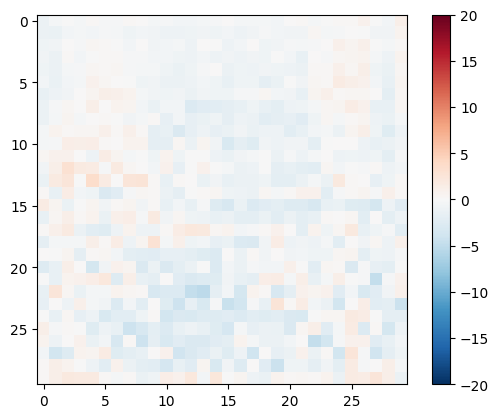

In [ ]:
#testing the discriminator
disc_out = discriminator([sample_monet, sample_photo], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

## Building the Cycle GAN
source: https://www.tensorflow.org/tutorials/generative/cyclegan#import_and_reuse_the_pix2pix_models

In [ ]:
#Creating the Generators
generator_f = Generator()
generator_g = Generator()

#Discriminators
discriminator_x = Discriminator()
discriminator_y = Discriminator()

### Testing Generator & Discriminator

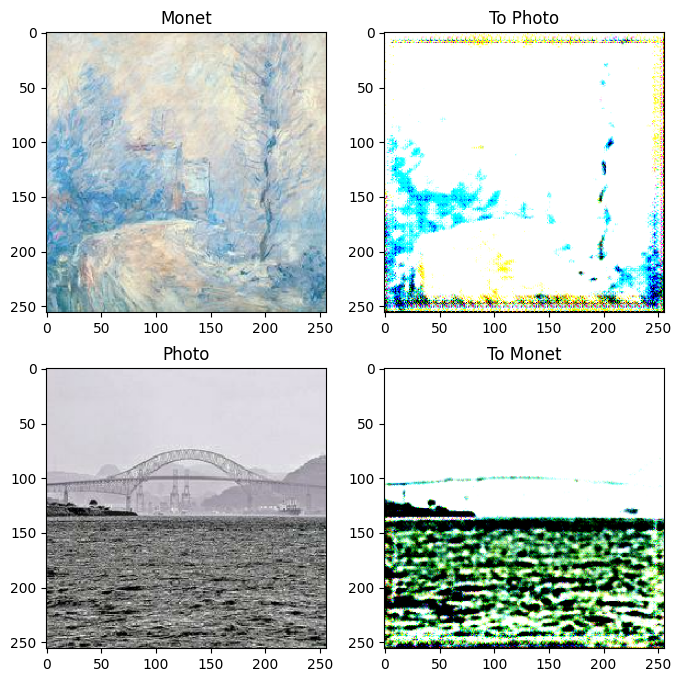

In [ ]:
to_monet = generator_g(sample_photo)
to_photo = generator_f(sample_monet)

plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_monet, to_photo, sample_photo, to_monet]
title = ['Monet', 'To Photo', 'Photo', 'To Monet']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

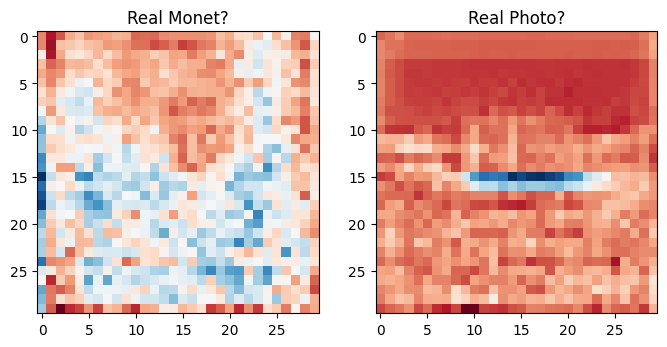

In [ ]:
plt.figure(figsize=(8, 8))

#sample_horse = sample_photo
#sample_zebra = sample_monet

plt.subplot(121)
plt.title('Real Monet?')
plt.imshow(discriminator_y([sample_monet, sample_monet])[0, ..., -1], cmap='RdBu_r')


plt.subplot(122)
plt.title('Real Photo?')
plt.imshow(discriminator_x([sample_photo, sample_photo])[0, ..., -1], cmap='RdBu_r')


plt.show()

### Loss Functions
*In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input x and the target y pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.*

In [ ]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

#initializing optimizers
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
#checkpoints
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

### Training
Leveraging the algorithim proposed as part of the TensorFlow tutorial for CycleGAN

In [ ]:

#function to generate images
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
import time
from IPython.display import clear_output
# Redefine train_step with corrected discriminator inputs
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y (Photo -> Monet)
    # Generator F translates Y -> X (Monet -> Photo).

    fake_y = generator_g(real_x, training=True) # Generated Monet
    cycled_x = generator_f(fake_y, training=True) # Cycled Photo (Monet -> Photo)

    fake_x = generator_f(real_y, training=True) # Generated Photo
    cycled_y = generator_g(fake_x, training=True) # Cycled Monet (Photo -> Monet)

    # same_x and same_y are used for identity loss.
    # These are generating an image in the target domain from an image in the same domain.
    same_x = generator_f(real_x, training=True) # Monet -> Photo
    same_y = generator_g(real_y, training=True) # Photo -> Monet

    # Discriminator X distinguishes real photos (real_x) from fake photos (fake_x)
    # Based on the discriminator definition, it takes two images of the same domain.
    # We feed it the real image and the real image for the "real" case,
    # and the generated fake image and the real image for the "fake" case.
    disc_real_x = discriminator_x([real_x, real_x], training=True)
    disc_fake_x = discriminator_x([fake_x, real_x], training=True) # Discriminating fake photo vs real photo

    # Discriminator Y distinguishes real monet paintings (real_y) from fake monet paintings (fake_y)
    # Similar to discriminator_x, we feed it the real image and the real image for "real",
    # and the generated fake image and the real image for "fake".
    disc_real_y = discriminator_y([real_y, real_y], training=True)
    disc_fake_y = discriminator_y([fake_y, real_y], training=True) # Discriminating fake monet vs real monet


    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y) # Generator G wants Discriminator Y to think fake_y is real
    gen_f_loss = generator_loss(disc_fake_x) # Generator F wants Discriminator X to think fake_x is real

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss + identity loss
    # Generator G's total loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    # Generator F's total loss
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    # Discriminator losses
    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

#### Checking the photo_sample after 1 epoch

In [ ]:
# EPOCHS = 1
# Training loop remains the same
def train_and_test(EPOCHS):
  for epoch in range(EPOCHS):
    start = time.time()

    n = 0
    for image_x, image_y in tf.data.Dataset.zip((photo_train,monet_train)):
      train_step(image_x, image_y)
      if n % 10 == 0:
        print ('.', end='')
      n += 1

    clear_output(wait=True)
    # Using a consistent image (sample_photo) so that the progress of the model
    # is clearly visible.
    # generate_images(generator_g, sample_photo)

    if (epoch + 1) % 5 == 0:
      ckpt_save_path = ckpt_manager.save()
      print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                          ckpt_save_path))

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  generate_images(generator_g, sample_photo)


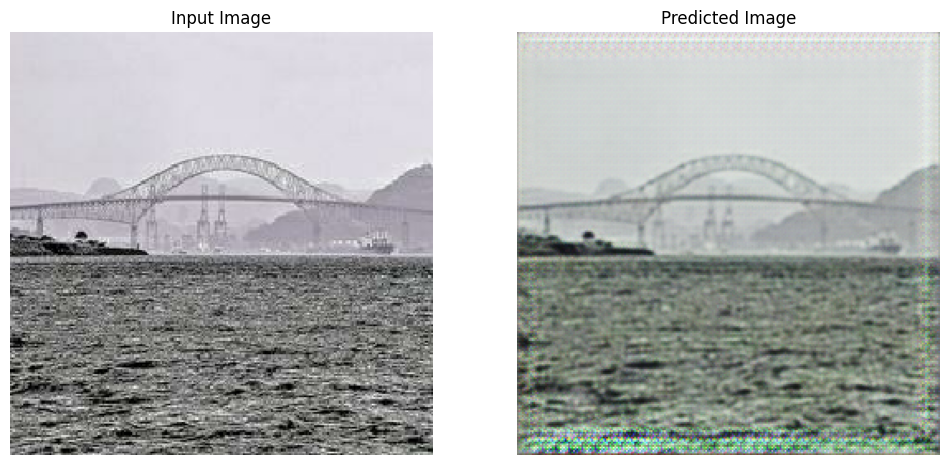

Time taken for epoch 1 is 127.68841290473938 sec



In [ ]:
train_and_test(1)

#### Checking the photo_sample after 10 epochs

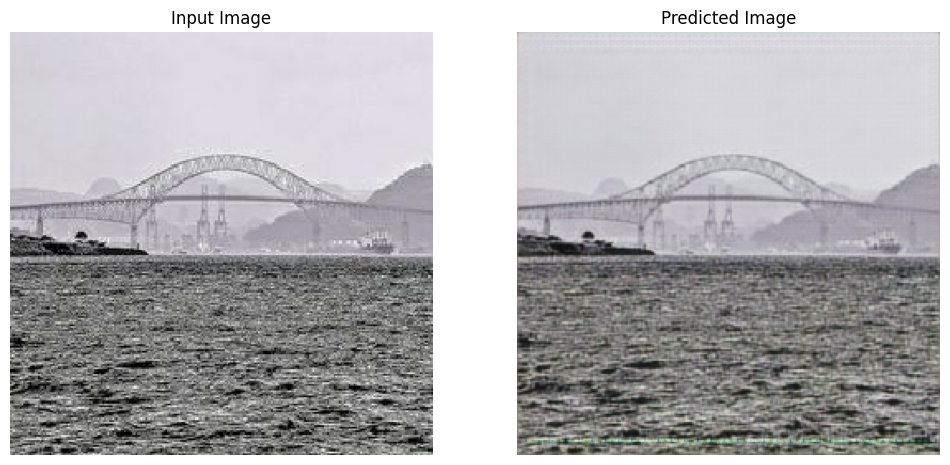

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-2
Time taken for epoch 10 is 134.02374601364136 sec



In [ ]:
train_and_test(10)

#### Checking the photo_sample after 20 epochs

Saving checkpoint for epoch 20 at ./checkpoints/train/ckpt-6
Time taken for epoch 20 is 158.1952965259552 sec



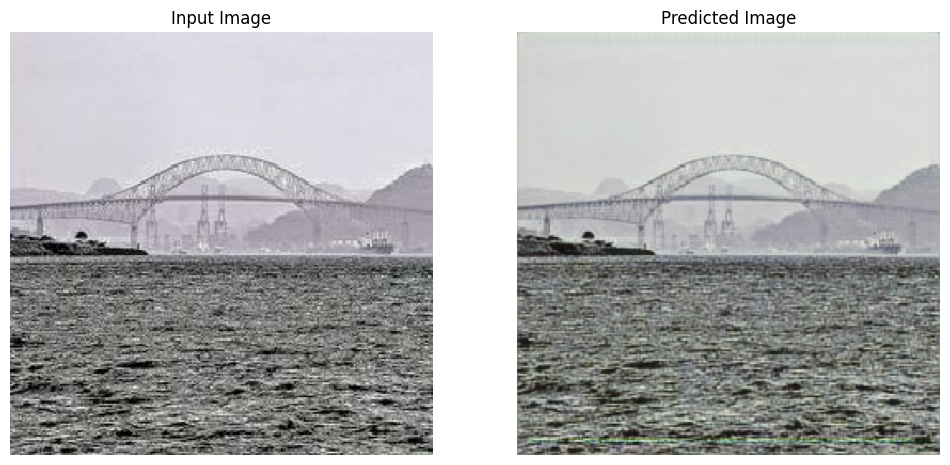

In [ ]:
#Checking the photo_sample after 20 epochs
train_and_test(20)

In [ ]:
# #dowloading the generator model so I don't have to train it again!
# generator_g.save('generator_g.keras')
# generator_f.save('generator_f.keras')
# discriminator_x.save('discriminator_x.keras')
# discriminator_y.save('discriminator_y.keras')

#Conclusion & Discussion

This notebook demonstrates the process of training a CycleGAN model to perform image-to-image translation by combining 2 tutorials from TensorFlow ([1](https://www.tensorflow.org/tutorials/generative/cyclegan),[2](https://www.tensorflow.org/tutorials/generative/cyclegan))

We began by loading and exploring the Monet and photo datasets, understanding their structure and basic properties. Key steps in the data preparation involved preprocessing images through normalization and applying data augmentation techniques like random jittering and mirroring to the training sets. These augmentations are crucial for improving the model's generalization and preventing overfitting.

The core of the project involved building the CycleGAN architecture, which consists of two generators (one for Photo -> Monet and one for Monet -> Photo) and two discriminators (one for real vs. generated Photos and one for real vs. generated Monets). The generator and discriminator models were adapted from the pix2pix architecture, utilizing convolutional layers and Instance Normalization.

We defined the loss functions essential for training a CycleGAN:
*   **Adversarial Loss:** To train the generators to produce images that are indistinguishable from real images by the discriminators.
*   **Cycle Consistency Loss:** A unique aspect of CycleGAN that encourages the model to learn meaningful mappings by requiring that translating an image from domain A to B and back to A should result in an image similar to the original.
*   **Identity Loss (Optional but used here):** Helps preserve the color composition between the input and output images within the same domain.

The training process involved iteratively updating the weights of the generators and discriminators based on these combined losses. We demonstrated the progression of the generator's ability to transform images over 1, 10, and 20 epochs by visualizing the output for a sample photo. As expected, with more training epochs, the generated images started to exhibit more characteristics of Monet's style.

The generated pictures are yet far from being "Monet sytle" pictures, meaning that the model needs further refinement and training as displayed below:

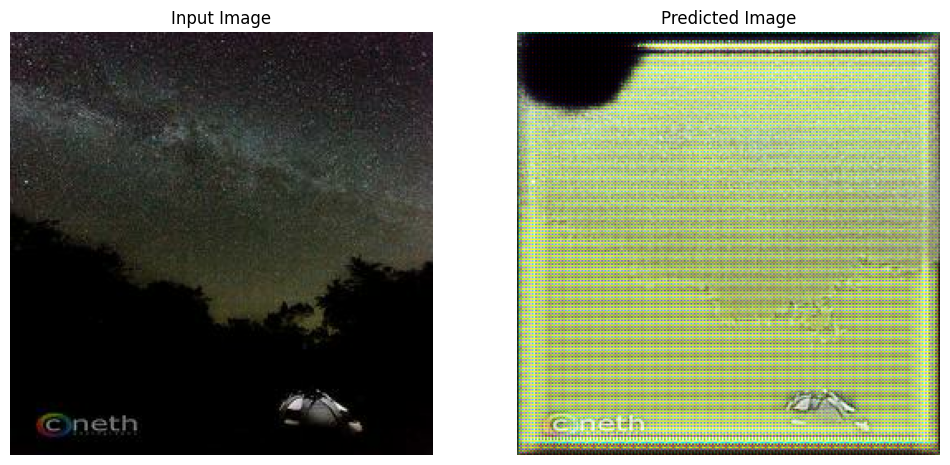

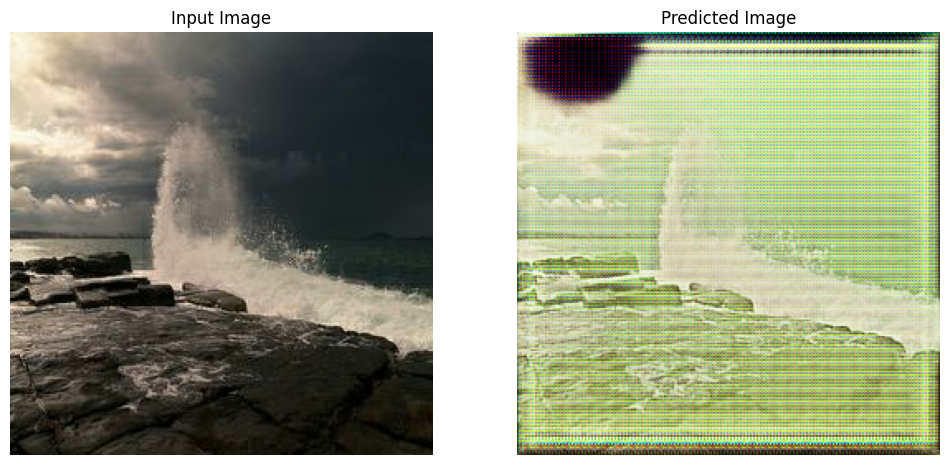

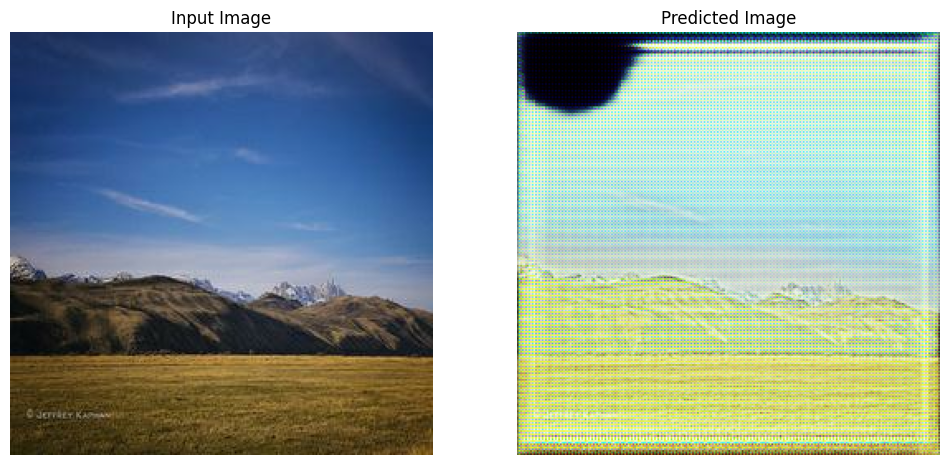

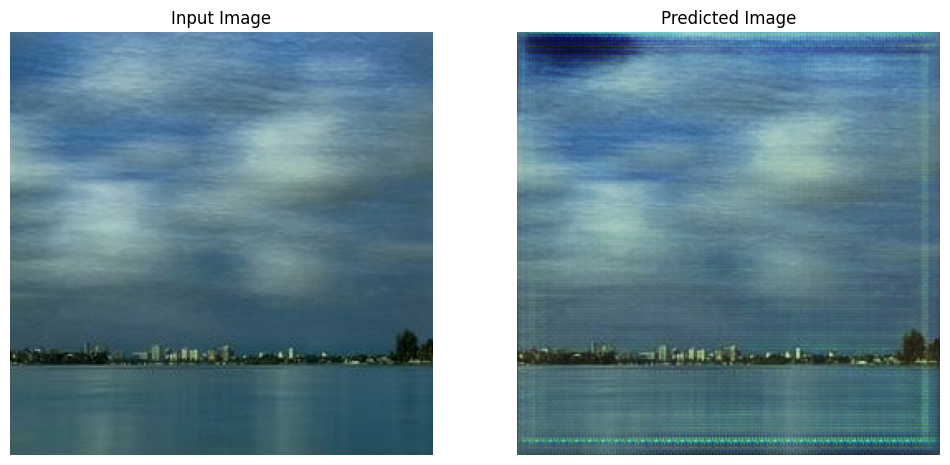

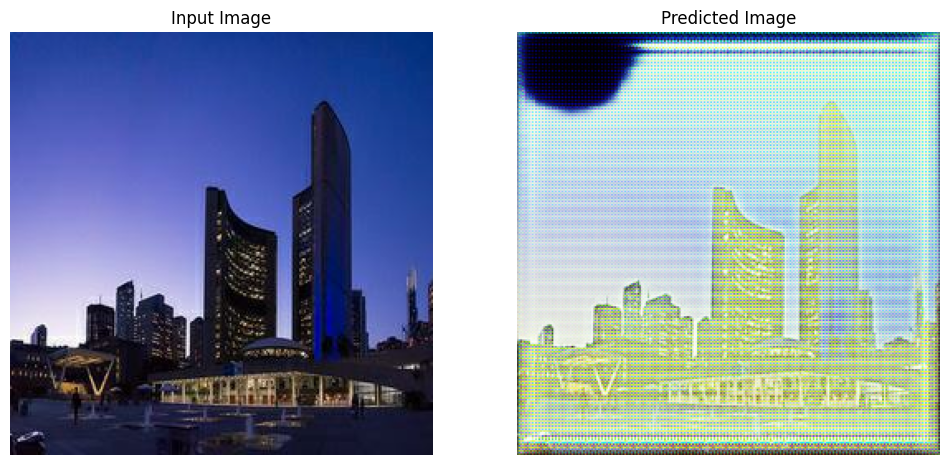

In [ ]:
for photo_path in photo_pics:
  # Load and preprocess the image from the file path
  processed_photo = load_image_and_preprocess(photo_path)
  # Now pass the processed tensor to the generate_images function
  generate_images(generator_g, processed_photo)

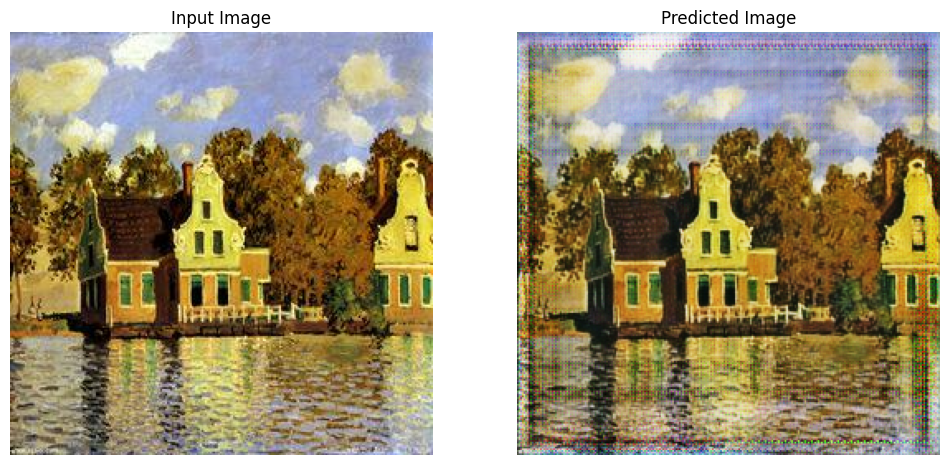

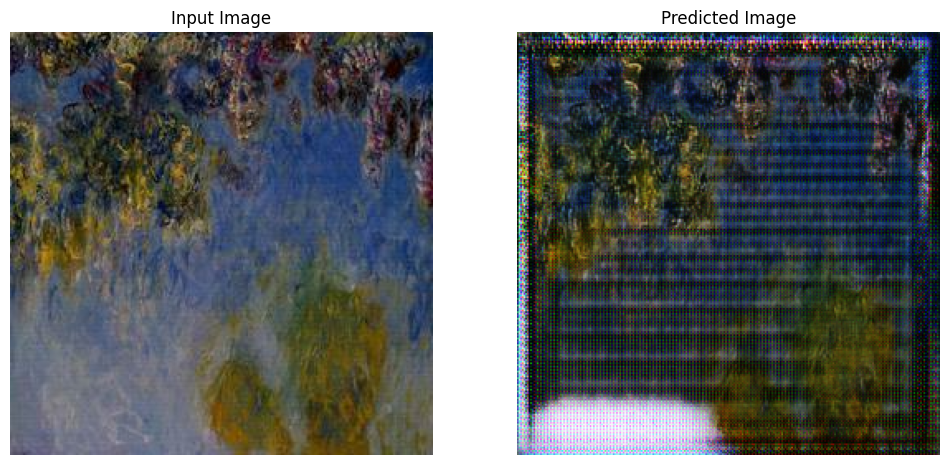

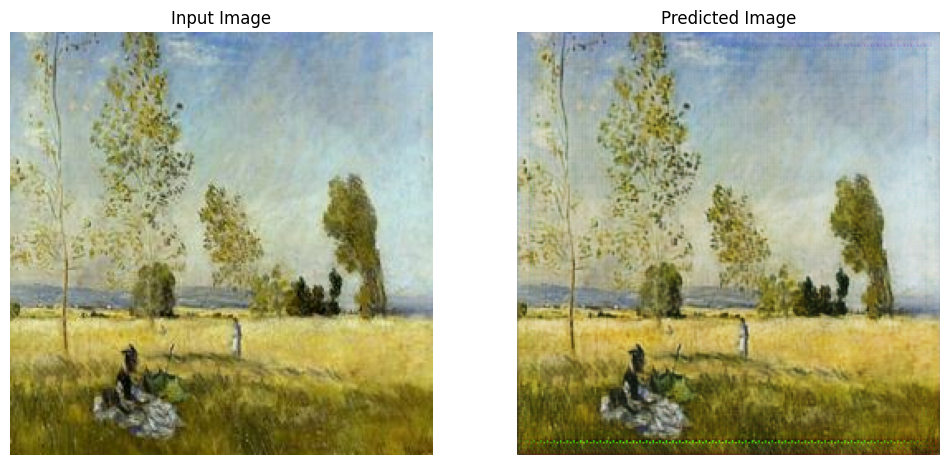

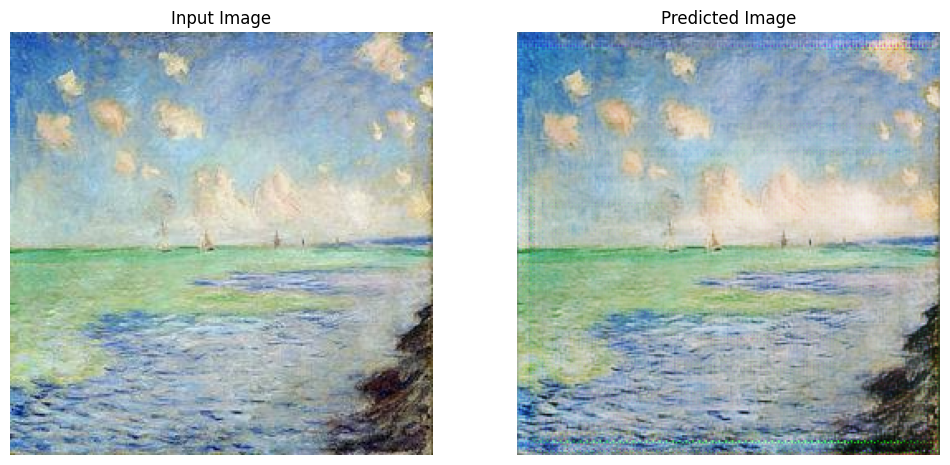

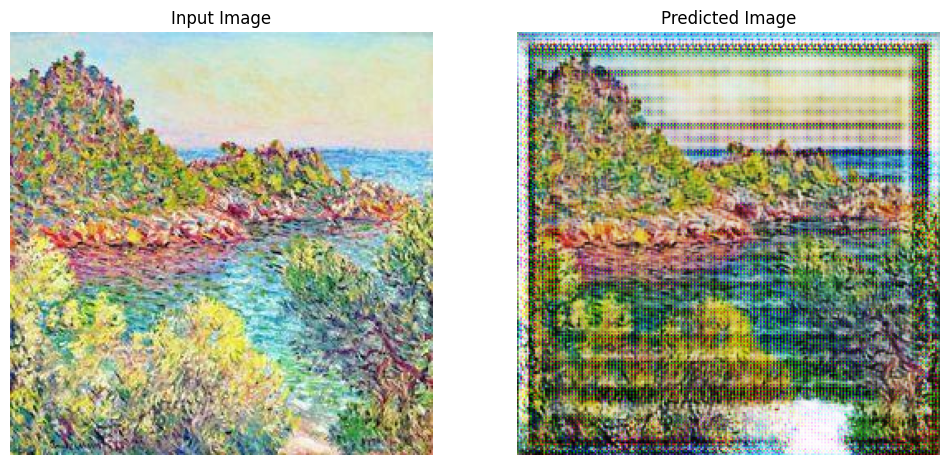

In [ ]:
#generate a 5 images from the random sample

def load_image_and_preprocess(image_path):
    # Load the image
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    # Resize the image to the expected size (256x256)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    # Normalize the image to [-1, 1]
    img = normalize(img)
    # Add a batch dimension as the model expects a batch of images
    img = tf.expand_dims(img, axis=0)
    return img

for photo_path in monet_pics:
  # Load and preprocess the image from the file path
  processed_photo = load_image_and_preprocess(photo_path)
  # Now pass the processed tensor to the generate_images function
  generate_images(generator_f, processed_photo)

## **Potential Improvements and Further Exploration:**

*   **Hyperparameter Tuning:** Experimenting with learning rates, batch sizes, and the weights of different loss components (LAMBDA) could potentially lead to better results.
*   **Model Architecture Variations:** While the pix2pix-based architecture is a good starting point, exploring other generator and discriminator designs could be beneficial.
*   **Training Duration:** Training for more epochs, especially on a more powerful GPU, might further improve the quality and realism of the generated paintings.
*   **Resolution:** Training on higher-resolution images would likely require modifications to the network architecture to handle the increased computational complexity, but could produce more detailed results.
*   **Evaluation Metrics:** Beyond visual inspection, using quantitative metrics like Frechet Inception Distance (FID) or Inception Score (IS) could provide a more objective assessment of the generated image quality and diversity.

Overall, this notebook served as a solid exercise for it's author to understand and implement the CycleGAN architecture for artistic style transfer. The results after 20 epochs show some progress, highlighting the power of adversarial training and cycle consistency in learning complex image transformations without paired data.

# Appendix: Generating Images to submit to Kaggle

In [ ]:
def generate_and_save(model, test_input, output_filename):
  """
  Generates an image using the model and saves it in JPEG format.

  Args:
    model: The TensorFlow generator model.
    test_input: The input image tensor.
    output_filename: The desired filename for the output image (without extension).
  """
  prediction = model(test_input, training=False)

  # The output of the generator is in the range [-1, 1].
  # Convert it back to [0, 1] for saving as an image.
  prediction_display = prediction[0] * 0.5 + 0.5

  # Convert the tensor to a NumPy array and then to uint8
  prediction_np = (prediction_display.numpy() * 255).astype('uint8')

  # Create the submission folder if it doesn't exist
  submission_folder = './submission'
  if not os.path.exists(submission_folder):
    os.makedirs(submission_folder)

  # Construct the full path for saving
  save_path = os.path.join(submission_folder, f'{output_filename}.jpg')

  # Save the image
  plt.imsave(save_path, prediction_np)
  print(f"Generated image saved to {save_path}")

In [ ]:
photo_jpg_directory = '/content/photo_jpg'

# Get a list of all image files in the directory
photo_files = [f for f in os.listdir(photo_jpg_directory) if f.endswith('.jpg')]

# Sort the files to have a consistent order (optional but good practice)
photo_files.sort()

print(f"Found {len(photo_files)} photo images to process.")

# Generate and save a painting for each photo
for i, photo_filename in enumerate(photo_files):
    # Construct the full path to the image file
    photo_path = os.path.join(photo_jpg_directory, photo_filename)

    try:
        # Load and preprocess the image
        processed_photo = load_image_and_preprocess(photo_path)

        # Generate a unique output filename based on the original filename
        # Remove the .jpg extension and add a prefix
        output_filename = f'monet_{os.path.splitext(photo_filename)[0]}'

        # Generate and save the image
        generate_and_save(generator_g, processed_photo, output_filename)

        # Optional: print progress
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1} images.")

    except Exception as e:
        print(f"Error processing image {photo_filename}: {e}")
        continue # Continue with the next image if an error occurs

print("Image generation and saving complete.")

Image generation and saving complete.


In [ ]:
#creating the zip file from the folder
!zip -r images.zip ./submission
print ('Zip file is ready!')

Zip file is ready!


In [ ]:
#submitting the file to kaggle
!pip install kaggle
!kaggle competitions files -c gan-getting-started

# Submit your submission.zip file
# Replace 'Your Submission Message Here' with a brief description of your submission
!kaggle competitions submit -c gan-getting-started -f images.zip -m "CycleGAN Photo to Monet Style Transfer"

print("Attempting to submit submission.zip to the gan-getting-started competition.")

100% 102M/102M [00:01<00:00, 69.9MB/s]
400 Client Error: Bad Request for url: https://www.kaggle.com/api/v1/competitions/submissions/submit/gan-getting-started
